<a href="https://colab.research.google.com/github/saadArfin/FitRepAnalyzer/blob/main/SkinDiseaseClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import shutil
source_path = '/content/drive/My Drive/Skin_Disease_Dataset'
destination_path = '/content/skin_disease_dataset'

# Copy dataset to Colab local storage
shutil.copytree(source_path, destination_path)
print("Dataset copied to:", destination_path)

Dataset copied to: /content/skin_disease_dataset


In [3]:

import os

base_dir = '/content/skin_disease_dataset'

# List categories
categories = os.listdir(base_dir)
print("Categories:", categories)

# List a few files in each category
for category in categories:
    category_path = os.path.join(base_dir, category)
    print(f"Category: {category}")
    print(os.listdir(category_path)[:5])  # Print first 5 files

Categories: ['Melanoma', 'Herpes', 'Monkeypox', 'Vitiligo', 'Eczema', 'Ringworm']
Category: Melanoma
['Melanoma (624).jpg', 'Melanoma (410).jpg', 'Melanoma (117).jpg', 'Melanoma (124).jpg', 'Melanoma (1009).jpg']
Category: Herpes
['Herpes (280).jpg', 'Herpes (36).jpg', 'Herpes (26).jpeg', 'Herpes (26).jpg', 'Herpes (69).jpg']
Category: Monkeypox
['MonkeyPox (174).png', 'MonkeyPox (19).jpg', 'MonkeyPox (115).png', 'MonkeyPox (140).jpg', 'MonkeyPox (11).jpg']
Category: Vitiligo
['roi112.jpg', 'roi197.jpg', 'roi123.jpg', 'roi200.jpg', 'roi146.jpg']
Category: Eczema
['eczema-nummular-110.jpg', 'eczema-nummular-182.jpg', 'eczema-hand-188.jpg', 'eczema-chronic-19.jpg', 'eczema-fingertips-78.jpg']
Category: Ringworm
['tinea-incognito-53.jpg', 'tinea-face-51.jpg', 'tinea-laboratory-62.jpg', 'tinea-foot-webs-68.jpg', 'tinea-body-172.jpg']


In [4]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split
from PIL import UnidentifiedImageError, Image

# Set paths
data_dir = '/content/skin_disease_dataset'
img_height, img_width = 224, 224  # Image dimensions
batch_size = 32

# Function to remove problematic files
def remove_invalid_images(data_dir):
    """
    Removes files from the dataset that cause UnidentifiedImageError when opened with PIL.

    Args:
        data_dir: The path to the dataset directory.
    """
    for root, _, files in os.walk(data_dir):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                # Attempt to open the image file
                Image.open(file_path).verify()
            except (UnidentifiedImageError, OSError) as e:
                print(f"Removing invalid image file: {file_path} - Error: {e}")
                os.remove(file_path)


# Remove invalid images before creating generators
remove_invalid_images(data_dir)



# Data generators with augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

def image_generator_with_error_handling(generator):
    """
    Wraps the image generator to handle UnidentifiedImageError.

    Args:
        generator: The original image generator (e.g., train_generator).

    Yields:
        Batches of images and labels, skipping files causing errors.
    """
    while True:
        try:
            yield next(generator)
        except UnidentifiedImageError as e:
            print(f"Skipping file due to error: {e}")


train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle = True
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle = False
)

# Use the wrapped generators
train_generator = image_generator_with_error_handling(train_generator)
val_generator = image_generator_with_error_handling(val_generator)

Removing invalid image file: /content/skin_disease_dataset/Melanoma/Melanoma (624).jpg - Error: cannot identify image file '/content/skin_disease_dataset/Melanoma/Melanoma (624).jpg'
Removing invalid image file: /content/skin_disease_dataset/Melanoma/Melanoma (467).jpg - Error: cannot identify image file '/content/skin_disease_dataset/Melanoma/Melanoma (467).jpg'
Removing invalid image file: /content/skin_disease_dataset/Melanoma/Melanoma (608).jpg - Error: cannot identify image file '/content/skin_disease_dataset/Melanoma/Melanoma (608).jpg'
Removing invalid image file: /content/skin_disease_dataset/Melanoma/Melanoma (480).jpg - Error: cannot identify image file '/content/skin_disease_dataset/Melanoma/Melanoma (480).jpg'
Removing invalid image file: /content/skin_disease_dataset/Melanoma/Melanoma (580).jpg - Error: cannot identify image file '/content/skin_disease_dataset/Melanoma/Melanoma (580).jpg'
Removing invalid image file: /content/skin_disease_dataset/Melanoma/Melanoma (574).jp

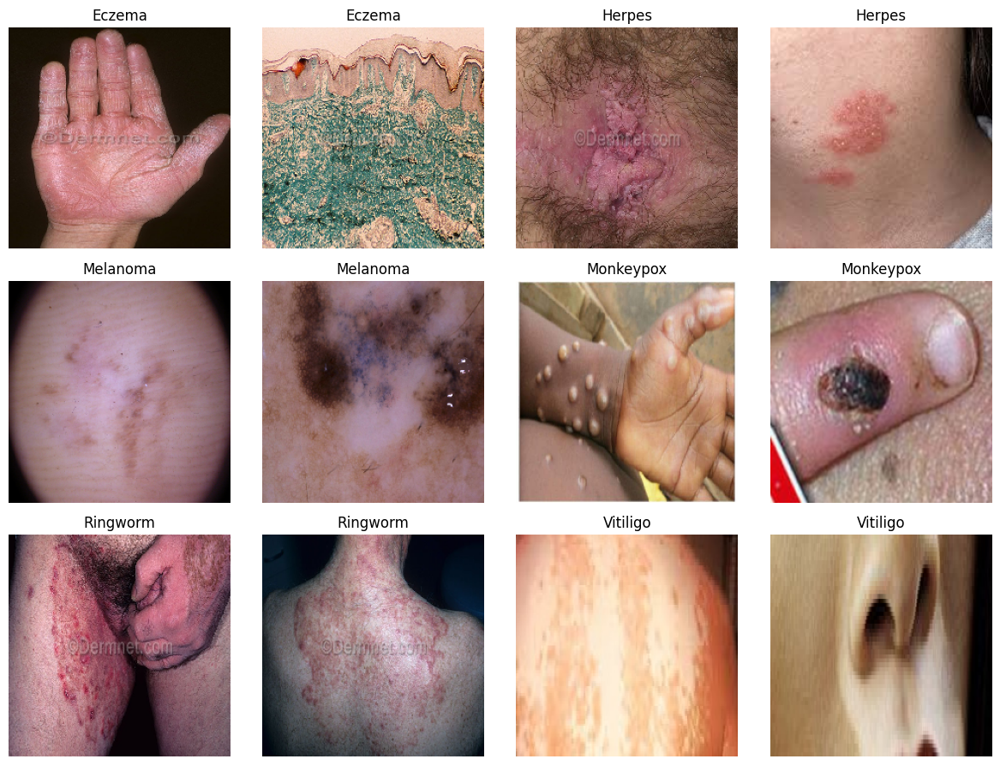

In [ ]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array


# Function to plot a grid of images
def plot_images(data_dir, num_images=16, img_size=(224, 224)):
    categories = os.listdir(data_dir)
    categories.sort()  # To ensure consistent class order
    plt.figure(figsize=(12, 12))

    images_displayed = 0

    for category in categories:
        category_path = os.path.join(data_dir, category)
        images = os.listdir(category_path)[:num_images // len(categories)]  # Take a few images per category

        for img_name in images:
            img_path = os.path.join(category_path, img_name)
            img = load_img(img_path, target_size=img_size)
            img_array = img_to_array(img) / 255.0  # Normalize for better visualization

            plt.subplot(4, 4, images_displayed + 1)
            plt.imshow(img_array)
            plt.title(category)
            plt.axis('off')

            images_displayed += 1
            if images_displayed >= num_images:
                break

        if images_displayed >= num_images:
            break

    plt.tight_layout()
    plt.show()

# Call the function to display images
plot_images(base_dir, num_images=16, img_size=(224, 224))

In [ ]:
# Inspect the training dataset
print("Training Dataset:")
for images, labels in train_generator:
    print("Image batch shape:", images.shape)
    print("Label batch shape:", labels.shape)
    break  # Stop after one batch to avoid printing indefinitely

# Inspect the validation dataset
print("Validation Dataset:")
for images, labels in val_generator:
    print("Image batch shape:", images.shape)
    print("Label batch shape:", labels.shape)
    break

Training Dataset:
Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 6)
Validation Dataset:
Image batch shape: (32, 224, 224, 3)
Label batch shape: (32, 6)


Found 2662 images belonging to 6 classes.
Found 662 images belonging to 6 classes.


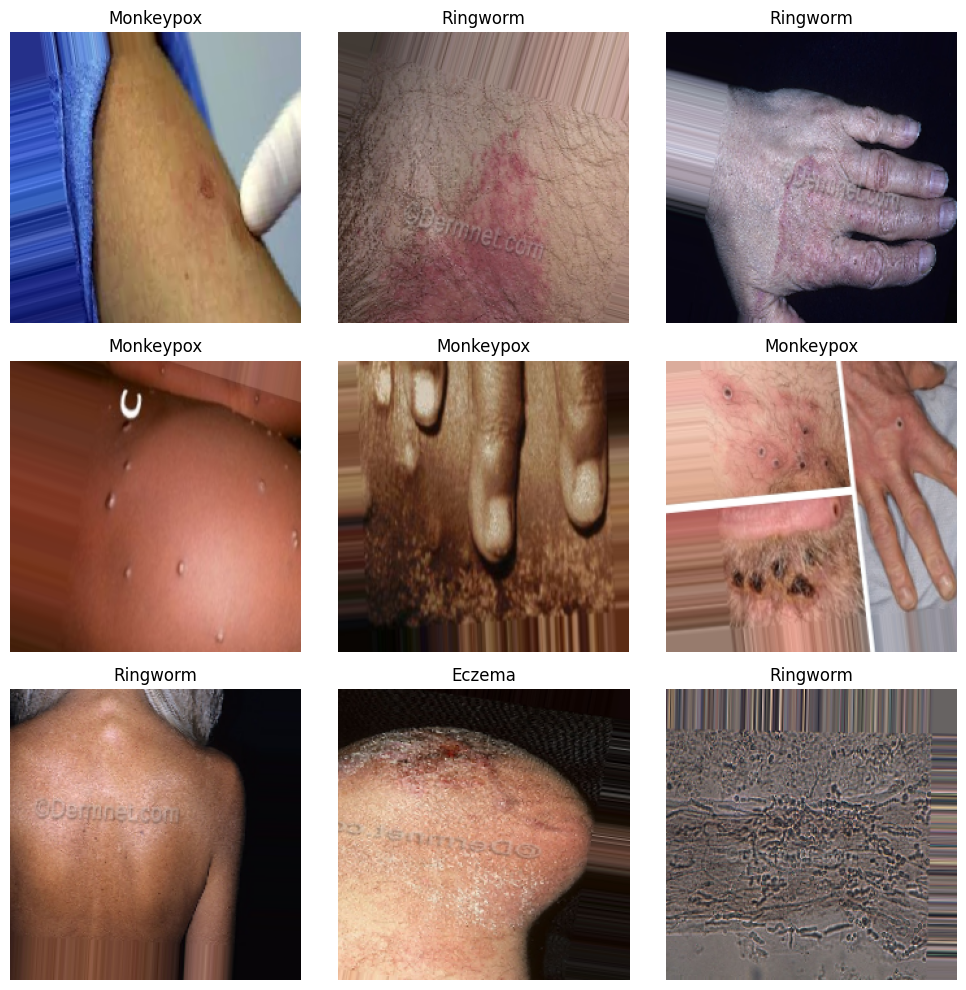

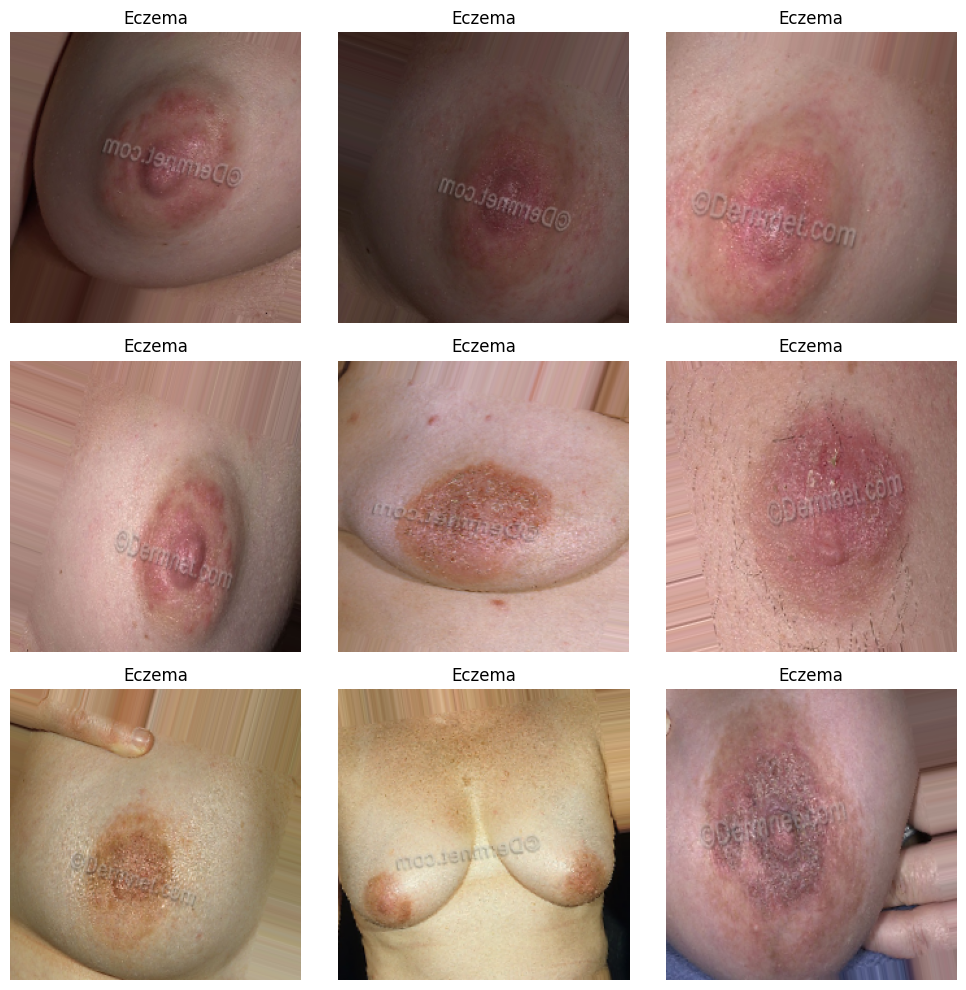

In [ ]:
import matplotlib.pyplot as plt

# Get class names from the original train_datagen
# before it was wrapped in error handling

# Create a new generator to get class indices
temp_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)
temp2_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
)
class_names = list(temp2_generator.class_indices.keys())

class_names = list(temp_generator.class_indices.keys())

# Visualize images and labels from the generator
def visualize_generator(generator, class_names, num_images=9):
    plt.figure(figsize=(10, 10))
    images, labels = next(generator)  # Get a batch of images and labels
    for i in range(num_images):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])  # Images are already rescaled by the generator
        label_idx = tf.argmax(labels[i]).numpy()  # Convert one-hot to class index
        plt.title(class_names[label_idx])  # Get class name
        plt.axis("off")
    plt.tight_layout()
    plt.show()

# Visualize training data
visualize_generator(train_generator, class_names)

# Visualize validation data
visualize_generator(val_generator, class_names)

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
def preprocess_data(image, label):
    image = tf.cast(image, tf.float32) / 127.5 - 1
    return image, label

# Convert generators to tf.data.Dataset
train_dataset = tf.data.Dataset.from_generator(
    lambda: train_generator,
    output_types=(tf.float32, tf.float32),  # Images and labels are both float32
    output_shapes=([None, img_height, img_width, 3], [None, len(temp_generator.class_indices)])  # Shape of images and labels
).map(preprocess_data).cache().prefetch(buffer_size=AUTOTUNE)

val_dataset = tf.data.Dataset.from_generator(
    lambda: val_generator,
    output_types=(tf.float32, tf.float32),
    output_shapes=([None, img_height, img_width, 3], [None, len(temp2_generator.class_indices)])
).map(preprocess_data).cache().prefetch(buffer_size=AUTOTUNE)
# Convert generators to tf.data.Dataset

# train_dataset = tf.data.Dataset.from_generator(
#     lambda: train_generator,
#     output_types=(tf.float32, tf.float32),  # Images and labels are both float32
#     output_shapes=([None, img_height, img_width, 3], [None])  # Shape of images and labels
# ).map(preprocess_data).cache().prefetch(buffer_size=AUTOTUNE)

# val_dataset = tf.data.Dataset.from_generator(
#     lambda: val_generator,
#     output_types=(tf.float32, tf.float32),
#     output_shapes=([None, img_height, img_width, 3], [None])
# ).map(preprocess_data).cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
train_dataset, val_dataset

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 6), dtype=tf.float32, name=None))>)

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam

###
def create_custom_model():
    # MobileNetV2 as the base model
    base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, pooling='avg')

    # Freeze the base model layers to prevent them from being updated during training
    base_model.trainable = False

    # Create the classification head
    model = Sequential([
        base_model, # Add the base model
        Dense(128, activation='relu'), # Add a dense layer with ReLU activation
        Dense(6, activation='softmax') # Add the output layer with softmax activation for 3 classes
    ])
    optimizer = Adam(learning_rate = 0.0001)
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

In [ ]:
train_dataset = train_dataset.map(preprocess_data)
val_dataset = val_dataset.map(preprocess_data)

model = create_custom_model()


model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 1280)                │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │             774 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,422,726 (9.24 MB)

 Trainable params: 164,742 (643.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [5]:
# Get helper functions file
import os

if not os.path.exists("helper_functions.py"):
    !wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
else:
    print("[INFO] 'helper_functions.py' already exists, skipping download.")

--2025-05-19 14:09:29--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0.001s  

2025-05-19 14:09:29 (16.2 MB/s) - ‘helper_functions.py’ saved [10246/10246]



In [ ]:
# Import series of helper functions for the notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, compare_historys

# Create TensorBoard callback (already have "create_tensorboard_callback()" from a previous notebook)
from helper_functions import create_tensorboard_callback

# Turn on mixed precision training
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy(policy="mixed_float16") # set global policy to mixed precision
mixed_precision.global_policy() # should output "mixed_float16" (if your GPU is compatible with mixed precision)

<DTypePolicy "mixed_float16">

In [ ]:
# Create ModelCheckpoint callback to save model's progress
checkpoint_path = "model_checkpoints.weights.h5" # saving weights requires ".h5" extension
from tensorflow.keras.callbacks import ModelCheckpoint
# checkpoint_path = ModelCheckpoint('model_checkpoints.weights.keras', save_freq='epoch')
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor="val_accuracy", # save the model weights with best validation accuracy
                                                      save_best_only=True, # only save the best weights
                                                      save_weights_only=True, # only save model weights (not whole model)
                                                      verbose=0) # don't print out whether or not model is being save

In [ ]:
# Turn off all warnings except for errors
tf.get_logger().setLevel('ERROR')
history= model.fit(train_dataset,
                  epochs=10,
                  steps_per_epoch=len(temp_generator),
                  validation_data=val_dataset,
                  validation_steps=int(len(temp2_generator)),
                  callbacks=[create_tensorboard_callback("training_logs",
                                                        "mobilenet_6_classes_all_data_feature_extract"),
                                                        model_checkpoint])

Saving TensorBoard log files to: training_logs/mobilenet_6_classes_all_data_feature_extract/20241209-212402
Epoch 1/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 78s 762ms/step - accuracy: 0.2554 - loss: 1.6820 - val_accuracy: 0.2613 - val_loss: 1.6615
Epoch 2/10
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - accuracy: 0.2640 - loss: 1.6704

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Step 1: Define the custom model
def create_custom_model():

    # Define block_1 as a MobileNetV2 layer directly, not a Sequential model
    block_1 = MobileNetV2(input_shape=(224, 224, 3), include_top=False, pooling='avg')


    block_2 = Sequential([
        Dense(128, activation='relu', input_shape=(1280,)),
        Dense(6, activation='softmax')
    ], name="sequential_3")

    # Create the main model
    model = Sequential([block_1, block_2])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


#image dimensions
img_height = 224
img_width = 224

#imageDataGenerator with rescaling and validation split
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)


train_dir = '/content/skin_disease_dataset'

image_size = (224, 224)
batch_size = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,  # Pass the directory path
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,  # Pass the directory path
    shuffle=True,
    seed = 123,
    image_size=image_size,
    batch_size=batch_size,
    validation_split=0.2,  # Specify validation split
    subset='validation'  # Specify validation subset
)


#Normalize datasets
def preprocess_data(image, label):
    image = tf.cast(image, tf.float32) / 127.5 - 1
    return image, label

train_dataset = train_dataset.map(preprocess_data)
validation_dataset = validation_dataset.map(preprocess_data)

#Train model
model1 = create_custom_model()

history = model1.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=10
)

#Evaluate and save model
loss, accuracy = model1.evaluate(validation_dataset)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")

model.save("mobile_net_v2_model.h5")

Found 3324 files belonging to 6 classes.
Found 3324 files belonging to 6 classes.
Using 664 files for validation.
Epoch 1/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 134s 686ms/step - accuracy: 0.6705 - loss: 0.8172 - val_accuracy: 0.6416 - val_loss: 2.6862
Epoch 2/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 30s 287ms/step - accuracy: 0.8303 - loss: 0.4325 - val_accuracy: 0.7063 - val_loss: 1.2529
Epoch 3/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 34s 221ms/step - accuracy: 0.8531 - loss: 0.3846 - val_accuracy: 0.6069 - val_loss: 1.8804
Epoch 4/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - accuracy: 0.8751 - loss: 0.3082 - val_accuracy: 0.5738 - val_loss: 2.8639
Epoch 5/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 26s 253ms/step - accuracy: 0.9070 - loss: 0.2538 - val_accuracy: 0.2816 - val_loss: 9.2669
Epoch 6/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 44s 278ms/step - accuracy: 0.9234 - loss: 0.2185 - val_accuracy: 0.4774 - val_loss: 4.9146
Epoch 7/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 25s 241ms/step - accuracy: 0.9308 - loss: 0.1820 - val_accu

Validation Loss: 4.884903907775879
Validation Accuracy: 0.4563252925872803


TypeError: cannot pickle 'module' object

In [11]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Define the custom model with EfficientNetB0
def create_custom_model():

    #model using EfficientNetB0
    block_1 = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, pooling='avg')


    block_2 = Sequential([
        Dense(128, activation='relu', input_shape=(block_1.output_shape[-1],)),
        Dense(6, activation='softmax')
    ], name="classification_head")


    model = Sequential([block_1, block_2])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

#ImageDataGenerator with rescaling and validation split
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

#directory path for dataset
train_dir = '/content/skin_disease_dataset'

image_size = (224, 224)
batch_size = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset='validation',
    shuffle=True,
    seed=123,
    image_size=image_size,
    batch_size=batch_size
)

#Create and compile the EfficientNet model
model = create_custom_model()

#Train the model
model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=10
)

Found 3431 files belonging to 6 classes.
Found 3431 files belonging to 6 classes.
Using 686 files for validation.


In [ ]:
# Step 4: Evaluate and save the model
loss, accuracy = model.evaluate(validation_dataset)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")

model.save("efficient_net_b0_model.h5") # Call
# Use tf.saved_model.save for SavedModel format
# tf.saved_model.save(model, "efficient_net_b0_saved_model")

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9651 - loss: 0.1877


Validation Loss: 0.18118974566459656
Validation Accuracy: 0.9593373537063599


In [ ]:
# Step 4: Evaluate and save the model
loss, accuracy = model2.evaluate(validation_dataset)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")

model.save("inception_v3_model.h5") # Call

21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 94ms/step - accuracy: 0.8258 - loss: 0.4756


Validation Loss: 0.48774802684783936
Validation Accuracy: 0.8268072009086609


In [ ]:
import numpy as np
import os
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img

#Load and preprocess the dataset
def load_images_from_directory(directory, img_size=(224, 224)):
    X, y = [], []
    classes = sorted(os.listdir(directory))
    class_indices = {cls: idx for idx, cls in enumerate(classes)}

    for cls in classes:
        cls_dir = os.path.join(directory, cls)
        if os.path.isdir(cls_dir):
            for img_name in os.listdir(cls_dir):
                img_path = os.path.join(cls_dir, img_name)
                try:
                    img = load_img(img_path, target_size=img_size)
                    img_array = img_to_array(img)
                    X.append(img_array)
                    y.append(class_indices[cls])
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
    return np.array(X), np.array(y)

#Load dataset
data_dir = '/content/skin_disease_dataset'
img_size = (224, 224)

X, y = load_images_from_directory(data_dir, img_size)

#Normalize pixel values
X = X / 255.0

#flatten images for SVM input
X_flat = X.reshape(X.shape[0], -1)

#Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_flat, y, test_size=0.2, random_state=42)

#Train the SVM model
print("Training SVM...")
svm_model = SVC(kernel='rbf', C=1, gamma='scale', probability=True)
svm_model.fit(X_train, y_train)

#evaluate the SVM model
y_pred = svm_model.predict(X_val)

print("Classification Report:")
print(classification_report(y_val, y_pred))

accuracy = accuracy_score(y_val, y_pred)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")


Training SVM...


In [ ]:
import numpy as np
import os
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img

# Step 1: Load and preprocess the dataset
def load_images_from_directory(directory, img_size=(224, 224)):
    X, y = [], []
    classes = sorted(os.listdir(directory))
    class_indices = {cls: idx for idx, cls in enumerate(classes)}

    for cls in classes:
        cls_dir = os.path.join(directory, cls)
        if os.path.isdir(cls_dir):
            for img_name in os.listdir(cls_dir):
                img_path = os.path.join(cls_dir, img_name)
                try:
                    img = load_img(img_path, target_size=img_size)
                    img_array = img_to_array(img)
                    X.append(img_array)
                    y.append(class_indices[cls])
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
    return np.array(X), np.array(y)

#Load the dataset
data_dir = '/content/skin_disease_dataset'
img_size = (224, 224)

X, y = load_images_from_directory(data_dir, img_size)

X = X / 255.0

#Flatten images for Random Forest input
X_flat = X.reshape(X.shape[0], -1)

#Split into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_flat, y, test_size=0.2, random_state=42)

#Train the Random Forest model
print("Training Random Forest...")
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

#Evaluate the model on training data
y_train_pred = rf_model.predict(X_train)
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f"Training Accuracy: {train_accuracy * 100:.2f}%")

#Evaluate the Random Forest model
y_pred = rf_model.predict(X_val)

print("Classification Report:")
print(classification_report(y_val, y_pred))

accuracy = accuracy_score(y_val, y_pred)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

Training Random Forest...
Training Accuracy: 100.00%
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.62      0.66       167
           1       0.65      0.65      0.65        79
           2       0.90      0.95      0.93       177
           3       0.70      0.56      0.62        62
           4       0.58      0.74      0.65       153
           5       0.70      0.26      0.38        27

    accuracy                           0.72       665
   macro avg       0.71      0.63      0.65       665
weighted avg       0.72      0.72      0.71       665

Validation Accuracy: 71.73%


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
model.save("/content/drive/My Drive/efficient_net_b0_model.h5")


In [ ]:
model.save("/content/drive/My Drive/efficient_net_b0_model.keras")


In [ ]:
P

In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image

# Explicitly define the Cast layer using tf.cast
class Cast(tf.keras.layers.Layer):
    def __init__(self, dtype='float32', **kwargs):
        super(Cast, self).__init__(**kwargs)
        self._dtype = dtype  # Use _dtype to store the value

    def call(self, inputs):
        return tf.cast(inputs, self._dtype)

    def get_config(self):
        config = super(Cast, self).get_config()
        config.update({'dtype': self._dtype})  # Include _dtype in the config
        return config

# Load the model with the custom Cast layer defined
model = load_model(
    "/content/efficient_net_b0_model.h5",
    custom_objects={"Cast": Cast}  # Register the custom Cast layer
)

# Load and preprocess the image
image = Image.open("/content/img1.jpeg").resize((224, 224))  # Resize based on model input size
image = np.array(image, dtype=np.float32) / 255.0  # Normalize pixel values
image = np.expand_dims(image, axis=0)  # Add batch dimension

# Run inference
output_data = model.predict(image)

# Display Prediction
predicted_class = np.argmax(output_data)  # Get the class with the highest probability
print("Predicted Class:", predicted_class)

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Predicted Class: 3


In [ ]:
loss, accuracy = model.evaluate(validation_dataset)
print(f"Validation Loss: {loss}")
print(f"Validation Accuracy: {accuracy}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 220ms/step - accuracy: 0.0972 - loss: 1.7987
Validation Loss: 1.7974863052368164
Validation Accuracy: 0.10391566157341003


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Explicitly define the Cast layer using tf.cast
class Cast(tf.keras.layers.Layer):
    def __init__(self, dtype='float32', **kwargs):
        super(Cast, self).__init__(**kwargs)
        self._dtype = dtype  # Use _dtype to store the value

    def call(self, inputs):
        return tf.cast(inputs, self._dtype)

    def get_config(self):
        config = super(Cast, self).get_config()
        config.update({'dtype': self._dtype})  # Include _dtype in the config
        return config

# Replace with your actual class names
image_path = "/content/img2.jpg"  # Path to your image
class_names = ['Eczema', 'Herpes', 'Melanoma', 'Monkeypox', 'Ringworm', 'Vitiligo']

# Load the trained model with the custom_objects parameter
model = load_model("/content/efficient_net_b0_model.h5", custom_objects={'Cast': Cast})  # Adjust model path if needed


# Load and preprocess the image
def predict_single_image(model, image_path, class_names):
    img = image.load_img(image_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)

    # Make a prediction
    predictions = model.predict(img_array)
    predicted_class_index = np.argmax(predictions, axis=1)[0]
    confidence = predictions[0][predicted_class_index]

    return class_names[predicted_class_index], confidence


predicted_class, confidence = predict_single_image(model, image_path, class_names)
print(f"Predicted class: {predicted_class} with confidence: {confidence:.2f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Predicted class: Monkeypox with confidence: 0.60


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_head             │ (None, 6)              │       164,742 │
│ (Sequential)                    │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,319 (16.08 MB)

 Trainable params: 4,172,290 (15.92 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 6 (36.00 B)

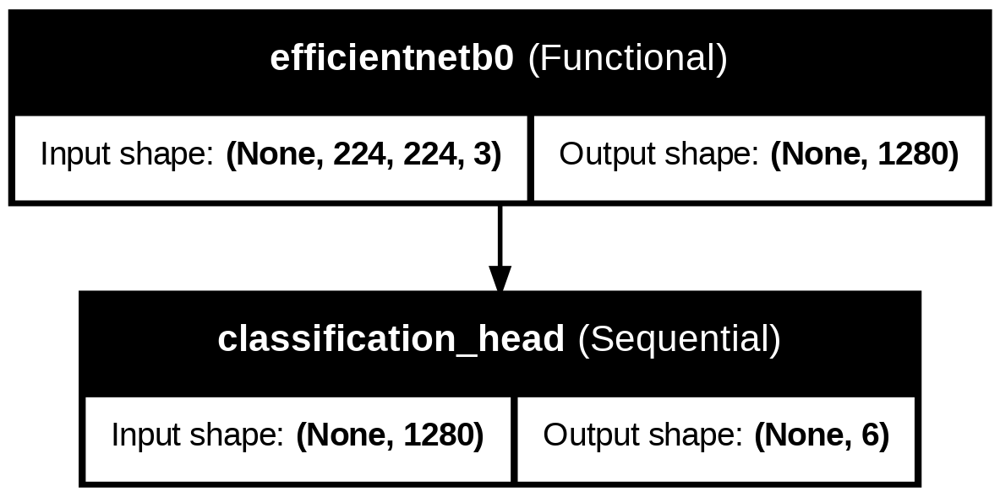

In [3]:
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

# Explicitly define the Cast layer using tf.cast
# This definition is needed when loading the model if the model contains this layer
class Cast(tf.keras.layers.Layer):
    def __init__(self, dtype='float32', **kwargs):
        super(Cast, self).__init__(**kwargs)
        self._dtype = dtype

    def call(self, inputs):
        return tf.cast(inputs, self._dtype)

    def get_config(self):
        config = super(Cast, self).get_config()
        config.update({'dtype': self._dtype})
        return config

# Load your model, providing the custom_objects dictionary
# Map the custom layer name 'Cast' to the defined Cast class
model = load_model('/content/efficient_net_b0_model (2).h5', custom_objects={'Cast': Cast})

# Print the architecture summary in text
model.summary()

# Optional: Visualize the model as an image
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

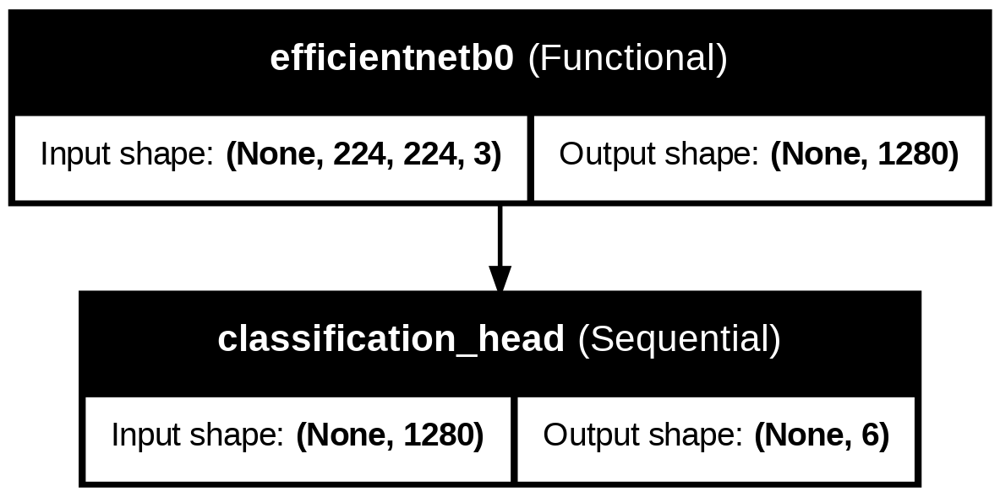

In [4]:
from IPython.display import Image
Image(filename='model_architecture.png')


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


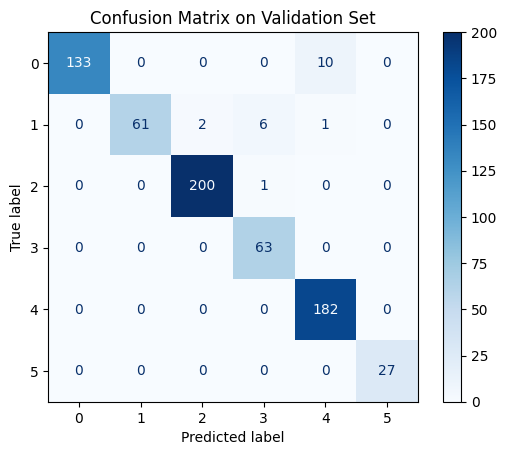

In [13]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

class Cast(tf.keras.layers.Layer):
    def __init__(self, dtype='float32', **kwargs):
        super(Cast, self).__init__(**kwargs)
        self._dtype = dtype

    def call(self, inputs):
        return tf.cast(inputs, self._dtype)

    def get_config(self):
        config = super(Cast, self).get_config()
        config.update({'dtype': self._dtype})
        return config

# 1. Load model
# Change the path to the location where the model was actually saved.
# Assuming you want to load the model saved to Google Drive.
model = tf.keras.models.load_model('/content/drive/My Drive/efficient_net_b0_model.h5', custom_objects={'Cast': Cast})

# 2. Unbatch the validation dataset to get full arrays
y_true = []
y_pred = []

# Note: If validation_dataset is large, unbatching it all at once might cause memory issues.
# A more memory-efficient approach would be to predict batch by batch.
for images, labels in validation_dataset:
    preds = model.predict(images)
    # Ensure labels are in the correct format (e.g., integer indices) if they are one-hot encoded
    if labels.ndim > 1 and labels.shape[1] > 1:
        y_true.extend(tf.argmax(labels, axis=1).numpy())
    else:
         y_true.extend(labels.numpy()) # Assuming labels are already integer indices

    y_pred.extend(np.argmax(preds, axis=1))

# Convert to numpy arrays
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# 3. Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# 4. Display the confusion matrix
# Ensure you have class names available for the confusion matrix labels if needed
# If you defined class_names earlier, you can pass them here:
# class_names = ['Eczema', 'Herpes', 'Melanoma', 'Monkeypox', 'Ringworm', 'Vitiligo'] # Example
# disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("Confusion Matrix on Validation Set")
plt.show()

In [15]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_head             │ (None, 6)              │       164,742 │
│ (Sequential)                    │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,315 (16.08 MB)

 Trainable params: 4,172,290 (15.92 MB)

 Non-trainable params: 42,023 (164.16 KB)

 Optimizer params: 2 (12.00 B)

In [16]:
from sklearn.metrics import classification_report, accuracy_score

# Optional: Get class names for readable labels
class_names = validation_dataset.class_names

# Classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report:\n")
print(report)

# If you want individual metrics too:
acc = accuracy_score(y_true, y_pred)
print(f"\nOverall Accuracy: {acc:.4f}")


Classification Report:

              precision    recall  f1-score   support

      Eczema       1.00      0.93      0.96       143
      Herpes       1.00      0.87      0.93        70
    Melanoma       0.99      1.00      0.99       201
   Monkeypox       0.90      1.00      0.95        63
    Ringworm       0.94      1.00      0.97       182
    Vitiligo       1.00      1.00      1.00        27

    accuracy                           0.97       686
   macro avg       0.97      0.97      0.97       686
weighted avg       0.97      0.97      0.97       686


Overall Accuracy: 0.9708


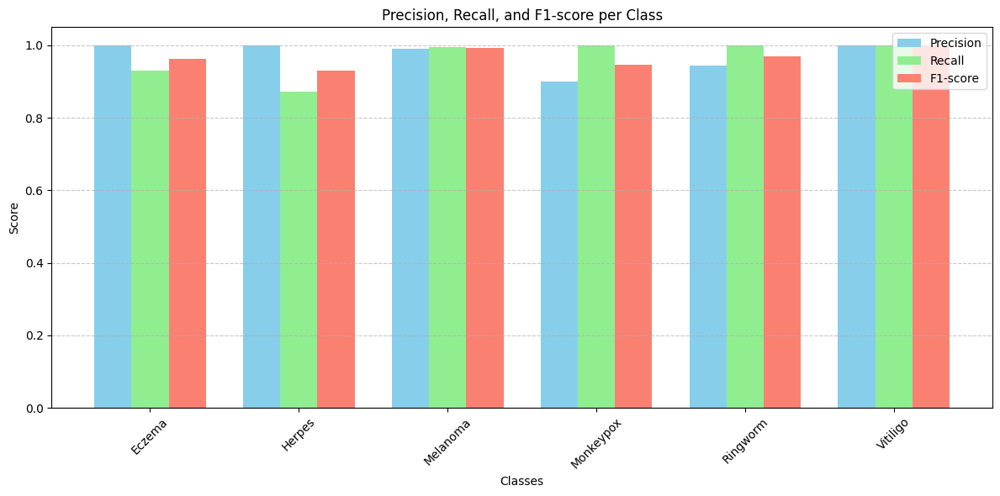

In [17]:
from sklearn.metrics import precision_recall_fscore_support
import matplotlib.pyplot as plt
import numpy as np

# Get class names
class_names = validation_dataset.class_names

# Get precision, recall, f1-score for each class
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, labels=range(len(class_names)))

x = np.arange(len(class_names))  # label locations
width = 0.25  # width of the bars

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(x - width, precision, width, label='Precision', color='skyblue')
plt.bar(x, recall, width, label='Recall', color='lightgreen')
plt.bar(x + width, f1, width, label='F1-score', color='salmon')

plt.xlabel('Classes')
plt.ylabel('Score')
plt.title('Precision, Recall, and F1-score per Class')
plt.xticks(x, class_names, rotation=45)
plt.ylim(0, 1.05)
plt.legend()
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [18]:
from sklearn.preprocessing import label_binarize

# One-hot encode y_true
n_classes = 6
y_true_onehot = label_binarize(y_true, classes=range(n_classes))


In [19]:
# Ensure you already have y_pred_probs (not just class labels)
y_pred_probs = []

for images, _ in validation_dataset:
    preds = model.predict(images)
    y_pred_probs.extend(preds)

y_pred_probs = np.array(y_pred_probs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 338ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


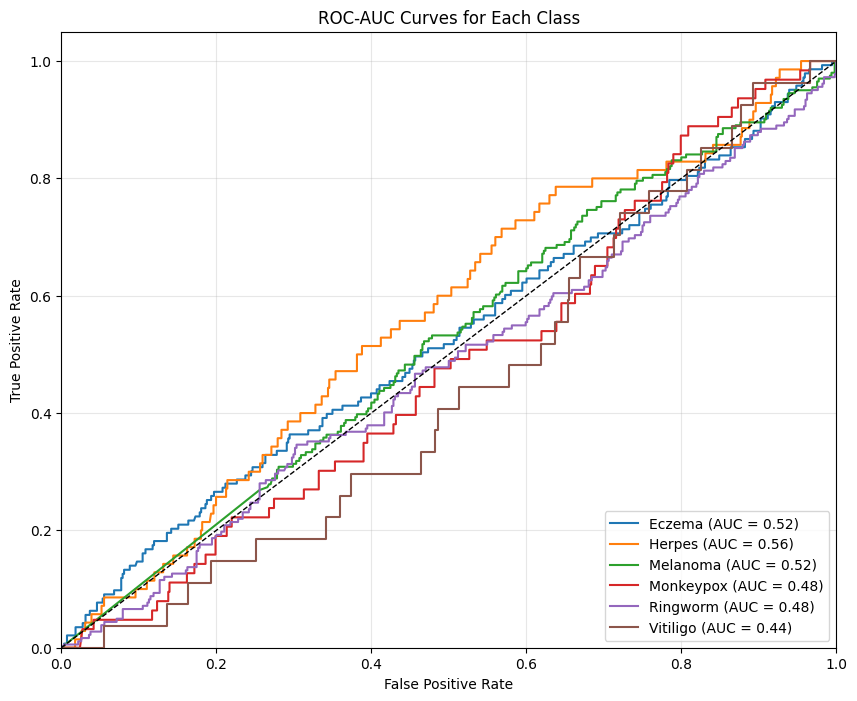

In [20]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Class names
class_names = validation_dataset.class_names

# Plot setup
plt.figure(figsize=(10, 8))

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_onehot[:, i], y_pred_probs[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_names[i]} (AUC = {roc_auc:.2f})')

# Random line
plt.plot([0, 1], [0, 1], 'k--', lw=1)

# Formatting
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-AUC Curves for Each Class')
plt.legend(loc="lower right")
plt.grid(alpha=0.3)
plt.show()


In [6]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import class_weight
import numpy as np
import os

# Function to get class weights from folder
def compute_class_weights(train_dir):
    class_names = sorted(os.listdir(train_dir))
    class_indices = {class_name: idx for idx, class_name in enumerate(class_names)}

    labels = []
    for class_name in class_names:
        class_path = os.path.join(train_dir, class_name)
        n_images = len(os.listdir(class_path))
        labels.extend([class_indices[class_name]] * n_images)

    weights = class_weight.compute_class_weight('balanced', classes=np.unique(labels), y=labels)
    return dict(enumerate(weights))

# Define improved model
def create_improved_model():
    block_1 = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, pooling='avg', weights='imagenet')
    block_1.trainable = False  # Fine-tune later

    block_2 = Sequential([
        Dense(256, activation='relu', input_shape=(block_1.output_shape[-1],)),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(6, activation='softmax')
    ], name="classification_head")

    model = Sequential([block_1, block_2])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=15,
    zoom_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_dir = '/content/skin_disease_dataset'
image_size = (224, 224)
batch_size = 32

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    subset='training',
    class_mode='sparse'
)

val_generator = val_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    subset='validation',
    class_mode='sparse'
)

# Get class weights
weights = compute_class_weights(os.path.join(train_dir))

# Callbacks
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.2, patience=2)
]



Found 2747 images belonging to 6 classes.
Found 684 images belonging to 6 classes.


In [7]:
# # Train
# model = create_improved_model()
# history = model.fit(
#     train_generator,
#     validation_data=val_generator,
#     epochs=15,
#     class_weight=weights,
#     callbacks=callbacks
# )
model = create_improved_model()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [8]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 1280)           │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ classification_head             │ (None, 6)              │       361,606 │
│ (Sequential)                    │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,411,177 (16.83 MB)

 Trainable params: 361,606 (1.38 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [9]:
model.get_layer("classification_head").summary()


Model: "classification_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 361,606 (1.38 MB)

 Trainable params: 361,606 (1.38 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
!pip install pydot
!apt install graphviz


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 34 not upgraded.


In [13]:
tensorboard --logdir logs/fit


Reusing TensorBoard on port 6006 (pid 16541), started 0:00:35 ago. (Use '!kill 16541' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#Define the custom model with EfficientNetB0
def create_custom_model():

    #model using EfficientNetB0
    block_1 = EfficientNetB0(input_shape=(224, 224, 3), include_top=False, pooling='avg')


    block_2 = Sequential([
        Dense(128, activation='relu', input_shape=(block_1.output_shape[-1],)),
        Dense(6, activation='softmax')
    ], name="classification_head")


    model = Sequential([block_1, block_2])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

#ImageDataGenerator with rescaling and validation split
train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

#directory path for dataset
train_dir = '/content/skin_disease_dataset'

image_size = (224, 224)
batch_size = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    shuffle=True,
    image_size=image_size,
    batch_size=batch_size
)

validation_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset='validation',
    shuffle=True,
    seed=123,
    image_size=image_size,
    batch_size=batch_size
)

#Create and compile the EfficientNet model
model = create_custom_model()

#Train the model
model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=10
)